In [6]:
import matplotlib.pyplot as plt
import xarray as xr
import numpy as np
import pandas as pd
import glob
import re
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import matplotlib.pyplot as plt
import matplotlib

In [7]:
#load model output files
s1=xr.open_dataset('../cesm_output_convert/analysis/downscale_results/wrfpost_run_2000_01_d02.nc')
s2=xr.open_dataset('../cesm_output_convert/analysis/downscale_results/wrfpost_run_eas0c_01_d02.nc')
#load geography files
geo02=xr.open_dataset('../cesm_output_convert/analysis/downscale_results/geo_em.d02.nc')

In [8]:
s1_mth=s1.PPT.resample('1M',dim='time',how='mean')
s2_mth=s2.PPT.resample('1M',dim='time',how='mean')

Month is  1  Mean over land:  0.03166283537640217


/home/likkhian/anaconda3/envs/python3env/lib/python3.6/site-packages/matplotlib/colors.py:496: RuntimeWarning: invalid value encountered in less
  cbook._putmask(xa, xa < 0.0, -1)


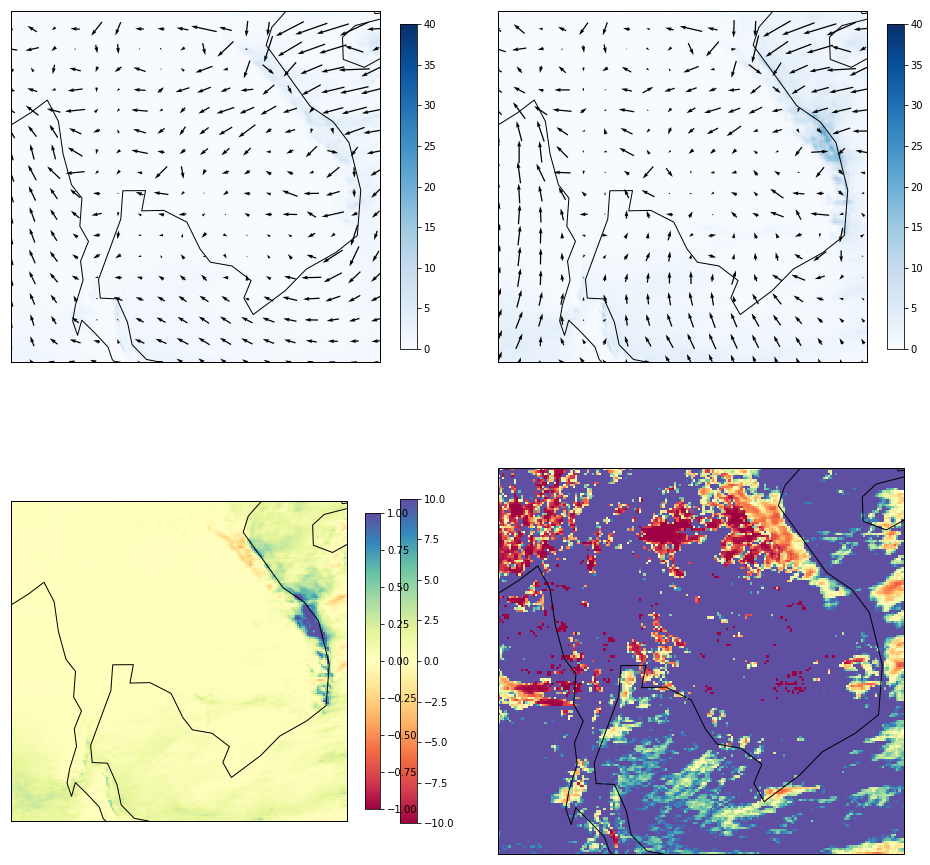

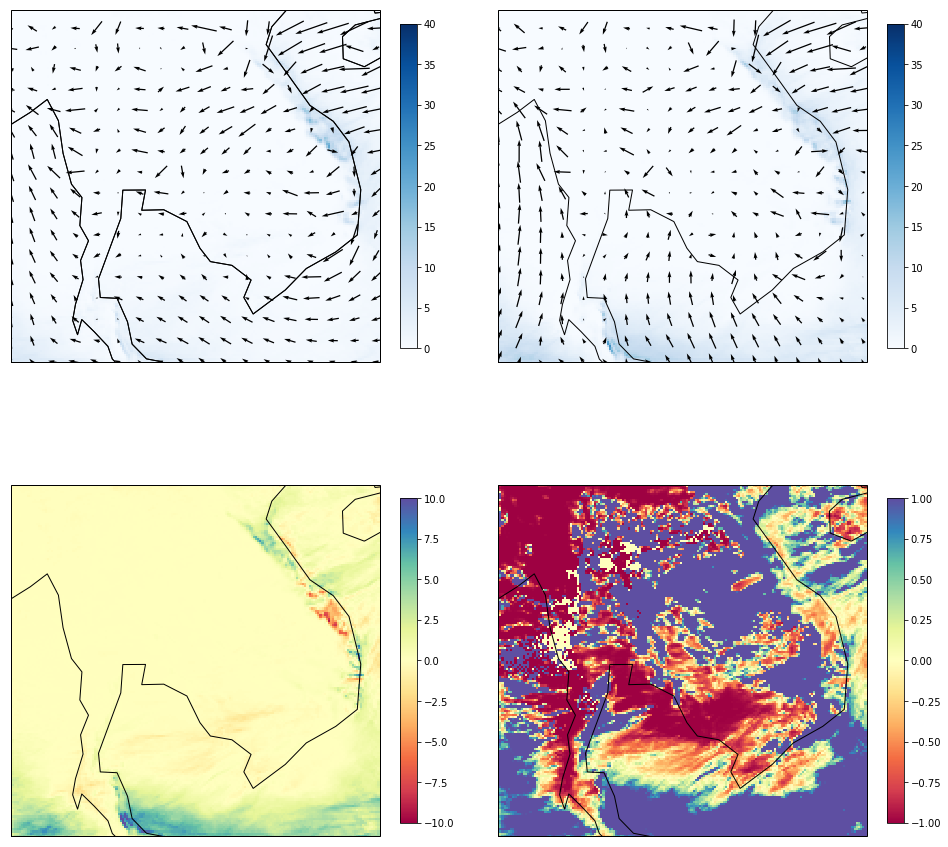

Month is  2  Mean over land:  0.1699821489768457


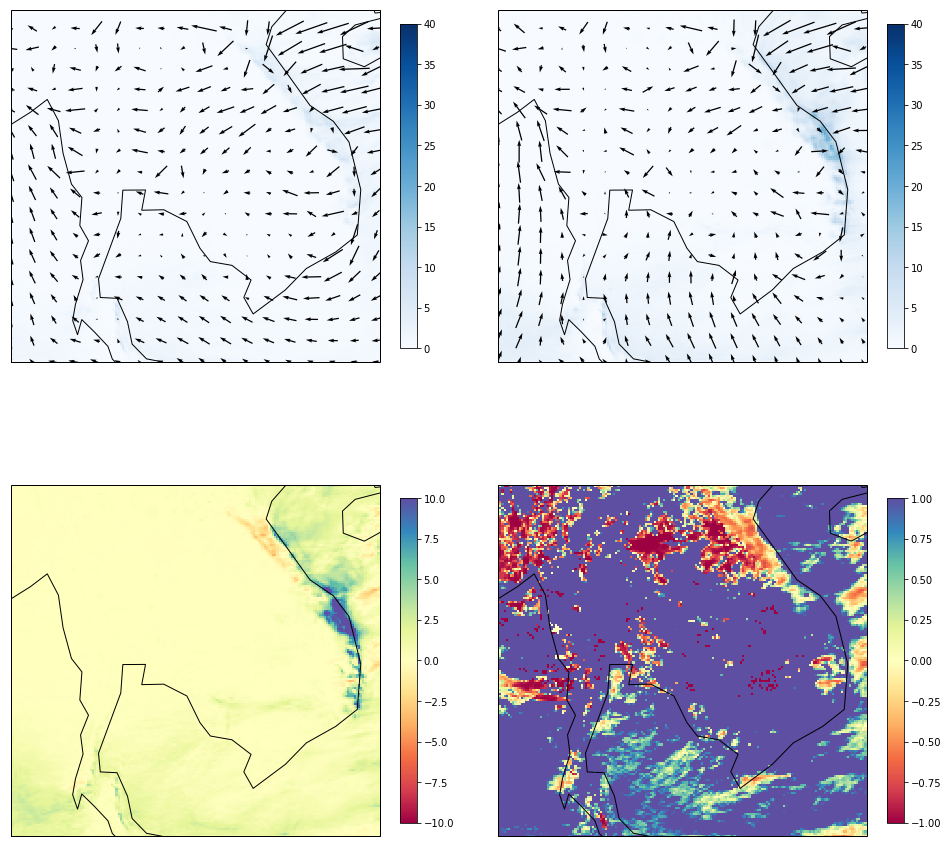

Month is  3  Mean over land:  0.016397481256456885


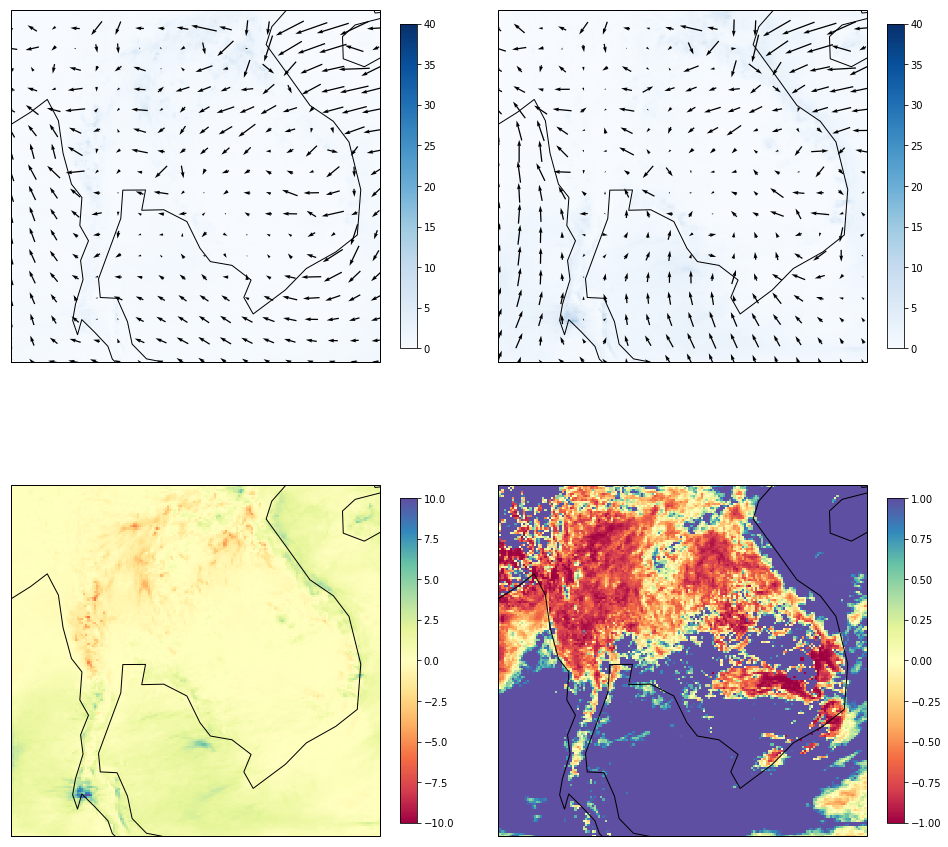

Month is  4  Mean over land:  0.7057970735231366


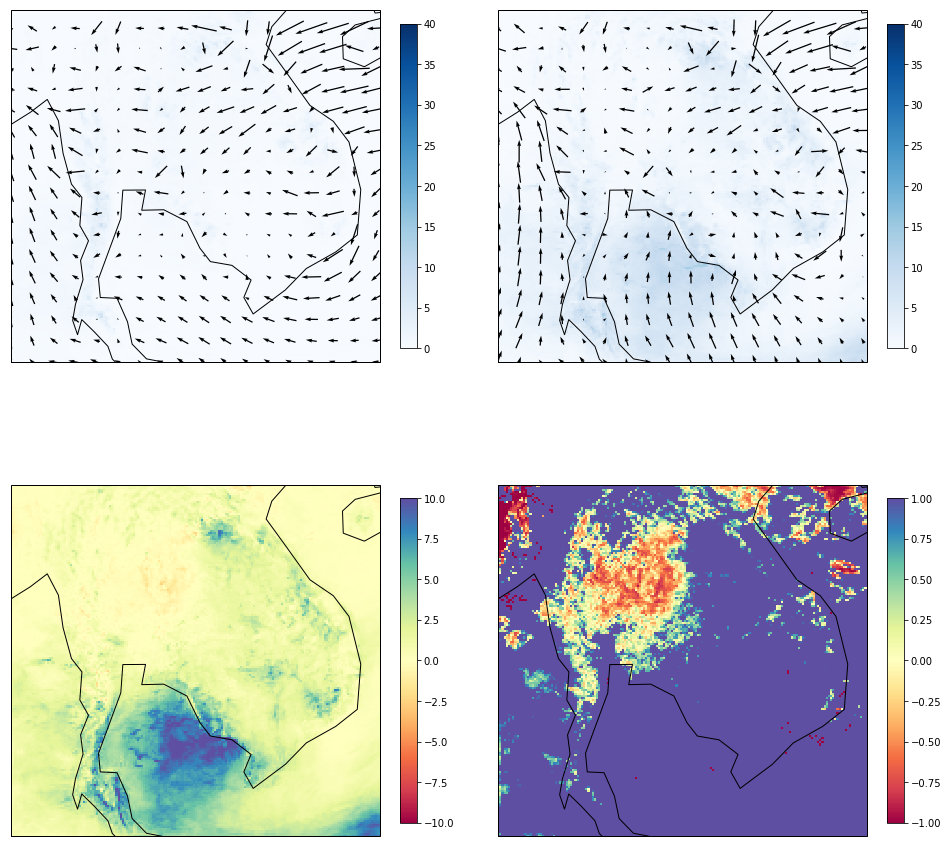

Month is  5  Mean over land:  -0.24269998639040108


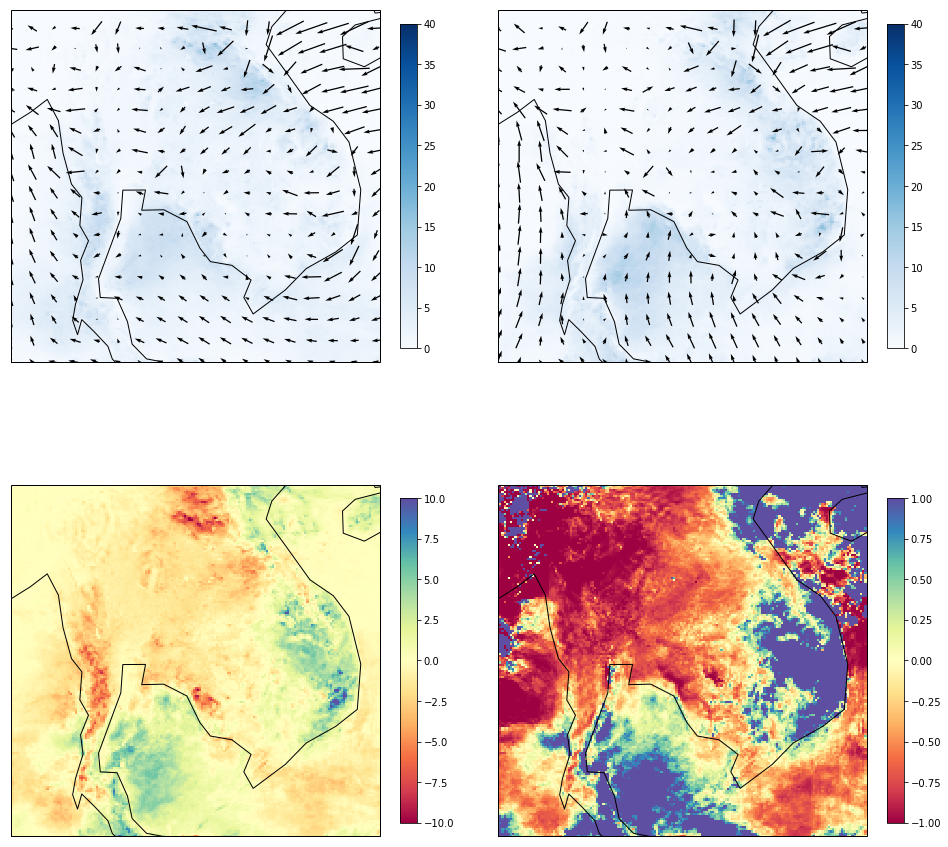

Month is  6  Mean over land:  -0.6848927900535888


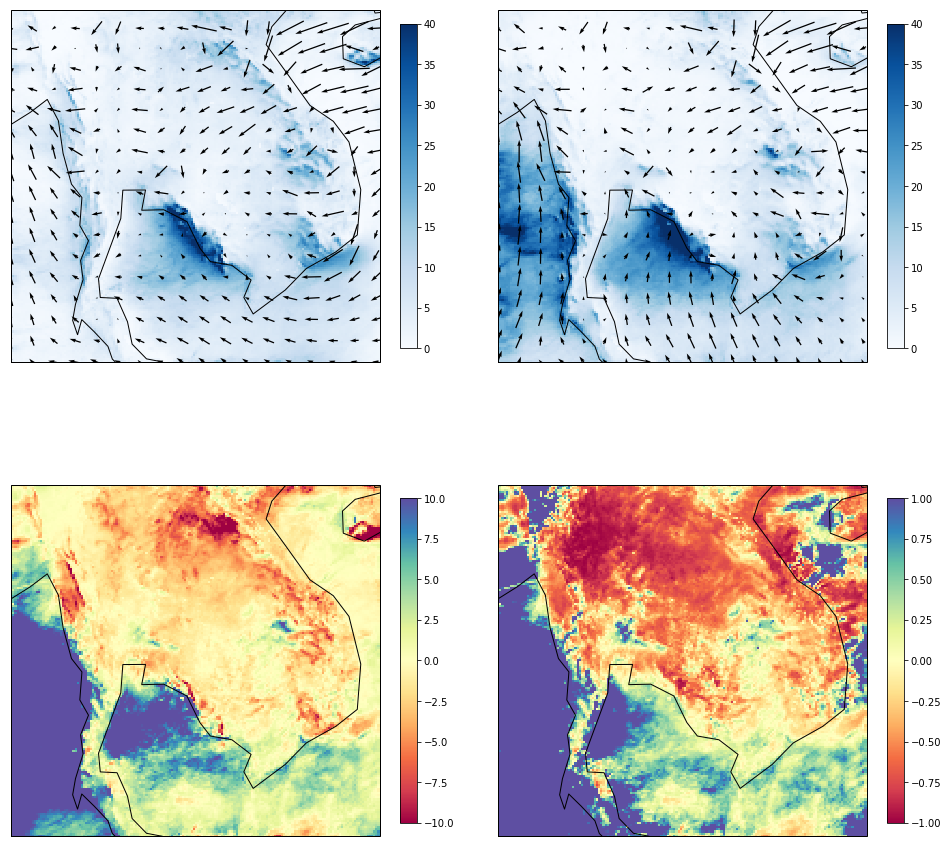

Month is  7  Mean over land:  0.15601202755180993


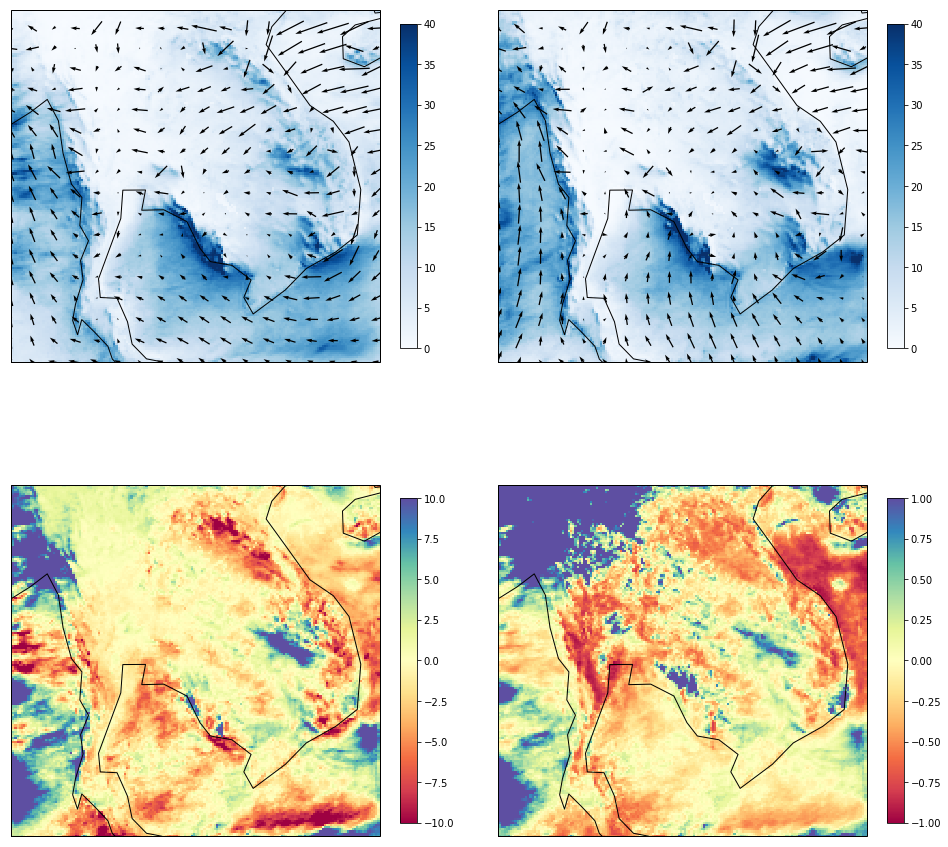

Month is  8  Mean over land:  -0.014813891630813173


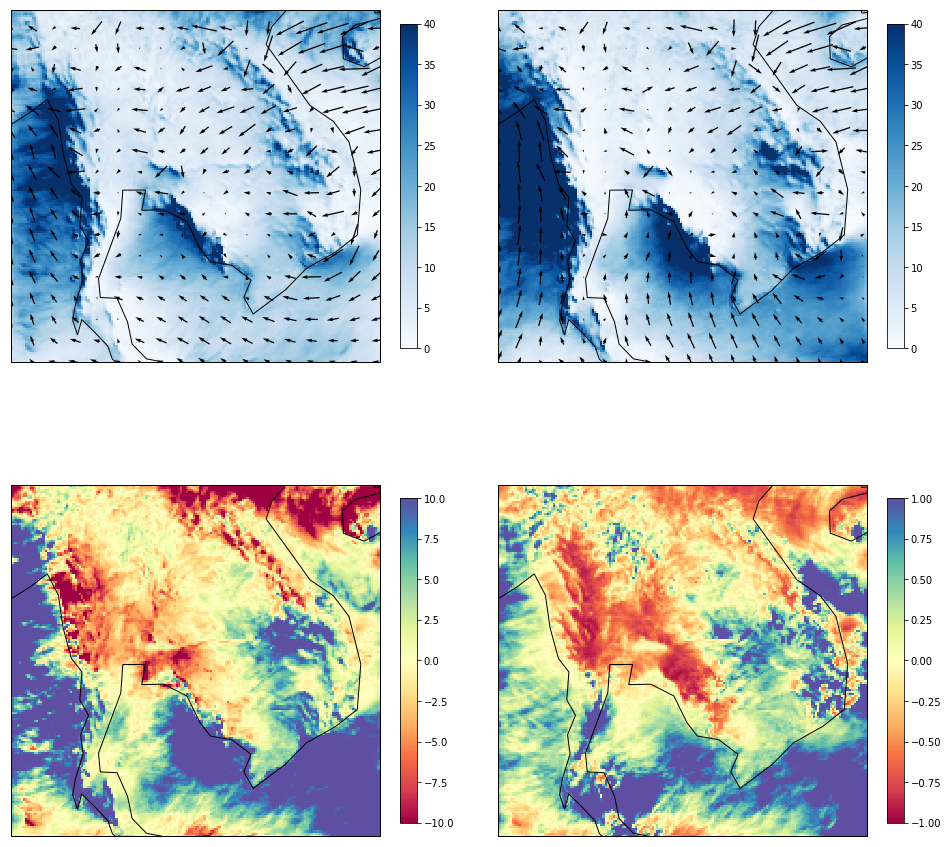

Month is  9  Mean over land:  -1.3214522998620237


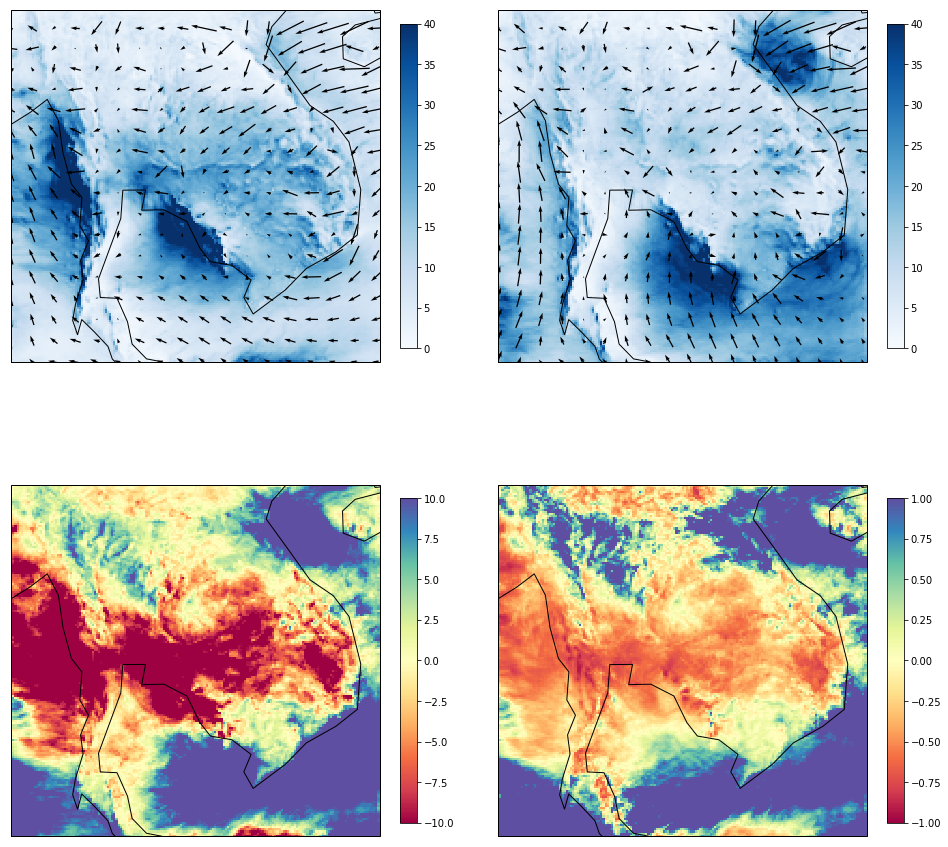

Month is  10  Mean over land:  -1.0557503444770842


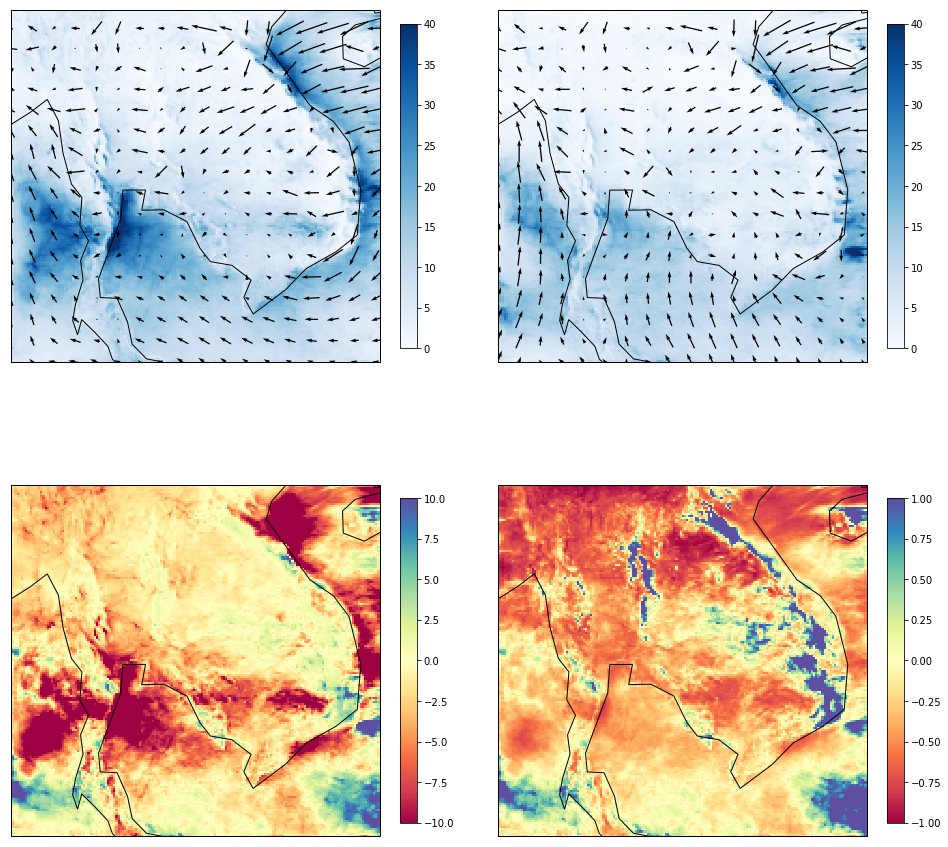

Month is  11  Mean over land:  -0.061626693438520286


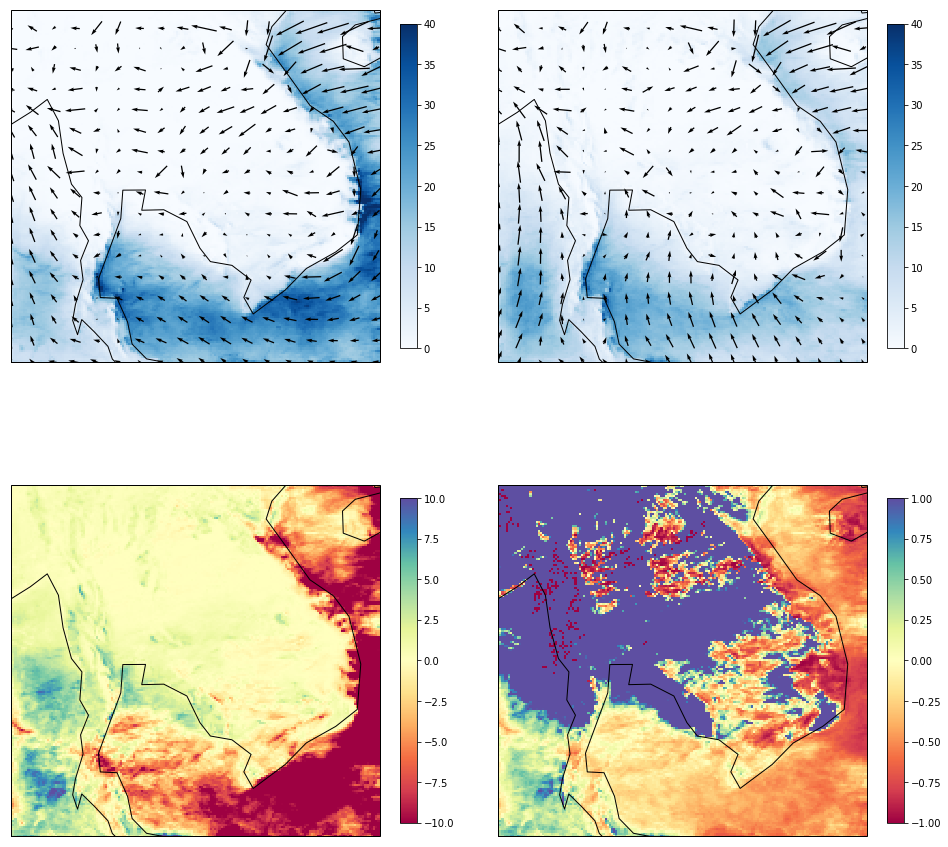

Month is  12  Mean over land:  -0.48593138485888226


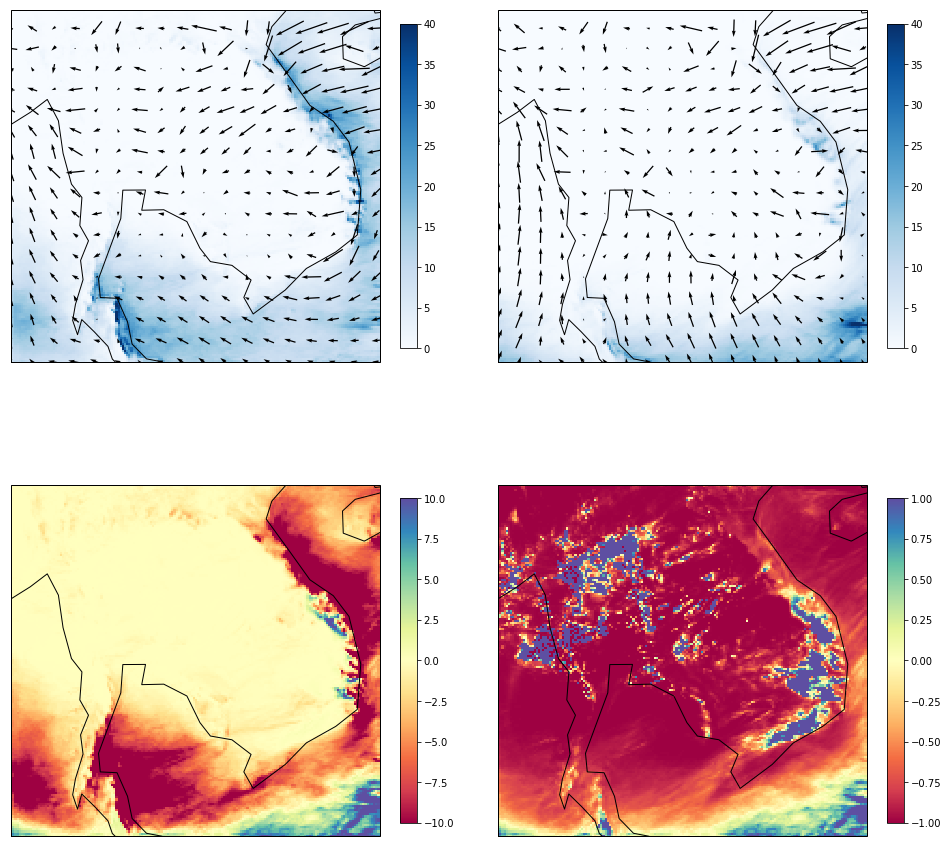

In [24]:
plt.rcParams["figure.figsize"] = 16,16
for tt in range(0,12):
    plt.figure(tt)
    uwind1=np.mean(s1.U10[:,::10,::10],axis=0)
    vwind1=np.mean(s1.V10[:,::10,::10],axis=0)
    slon1 = s1.lon[0::10]
    slat1 = s1.lat[0::10]
    uwind2=np.mean(s2.U10[:,::10,::10],axis=0)
    vwind2=np.mean(s2.V10[:,::10,::10],axis=0)
    slon2 = s2.lon[0::10]
    slat2 = s2.lat[0::10]
    ax1=plt.subplot(2,2,1,projection=ccrs.PlateCarree())
    ax1.pcolor(s1.lon, s1.lat,s1_mth[tt,:,:],vmin=0,vmax=40,cmap='Blues')
    ax1.quiver(slon1,slat1,uwind1,vwind1,pivot='middle')
    ax1.coastlines()
    ax2=plt.subplot(2,2,2,projection=ccrs.PlateCarree())
    ax2.pcolor(s1.lon,s1.lat,s2_mth[tt,:,:],vmin=0,vmax=40,cmap='Blues')
    ax2.quiver(slon2,slat2,uwind2,vwind2,pivot='middle')
    ax2.coastlines()
    cmap = plt.get_cmap('Blues')
    sm = plt.cm.ScalarMappable(cmap=cmap,norm=matplotlib.colors.Normalize(vmin=0, vmax=40))
    sm._A = []
    plt.colorbar(sm,ax=ax2,fraction=0.04, pad=0.05)
    plt.colorbar(sm,ax=ax1,fraction=0.04, pad=0.05)
    ax3=plt.subplot(2,2,3,projection=ccrs.PlateCarree())
    ax3.pcolor(s2.lon,s2.lat,s2_mth[tt,:,:]-s1_mth[tt,:,:],vmax=10,vmin=-10,cmap='Spectral')
    ax3.coastlines()
    cmap = plt.get_cmap('Spectral')
    sm = plt.cm.ScalarMappable(cmap=cmap,norm=matplotlib.colors.Normalize(vmin=-10, vmax=10))
    sm._A = []
    plt.colorbar(sm,ax=ax3,fraction=0.04, pad=0.05)
    ax4=plt.subplot(2,2,4,projection=ccrs.PlateCarree())
    ax4.pcolor(s2.lon,s2.lat,(s2_mth[tt,:,:]-s1_mth[tt,:,:])/(s1_mth[tt,:,:]+1e-16),vmax=1,vmin=-1,cmap='Spectral')
    ax4.coastlines()
    cmap = plt.get_cmap('Spectral')
    sm = plt.cm.ScalarMappable(cmap=cmap,norm=matplotlib.colors.Normalize(vmin=-1., vmax=1.))
    sm._A = []
    plt.colorbar(sm,ax=ax4,fraction=0.04, pad=0.05)
    print('Month is ',tt+1,' Mean over land: ',np.mean((s2_mth[tt,:,:]-s1_mth[tt,:,:])*s1.LANDMASK).data)
    plt.show()

In [13]:
avediff=np.mean(s2.PPT-s1.PPT,axis=0)


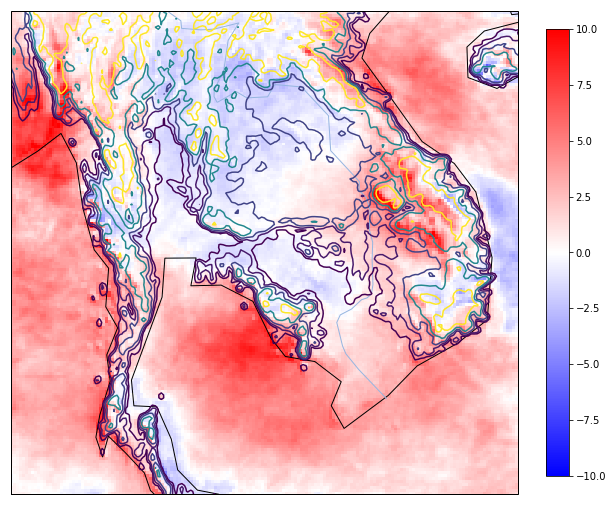

<xarray.DataArray 'PPT' ()>
array(0.9413739690668973)


In [14]:
#plot average difference over time in whole domain

plt.rcParams["figure.figsize"] = 10,10
ax=plt.subplot(projection=ccrs.PlateCarree())
ax.pcolor(s1.lon,s1.lat,avediff,cmap='bwr',vmin=-5,vmax=5)
ax.contour(s1.lon,s1.lat,geo02.HGT_M[0,5:-5,5:-5],levels=[50,100,200,400,800])
ax.coastlines()
ax.add_feature(cfeature.RIVERS)
cmap = plt.get_cmap('bwr')
sm = plt.cm.ScalarMappable(cmap=cmap,norm=matplotlib.colors.Normalize(vmin=-10, vmax=10))
sm._A = []
plt.colorbar(sm,ax=ax,fraction=0.04, pad=0.05)
plt.show()
print(np.mean(avediff))

## trmm monthly ppt and wind directions

In [15]:
trmm=xr.open_dataset('../ppt_data/trmm_monthly.nc',decode_times=False)
print(trmm)
ti,nlat,nlon=trmm.PPT.shape
print(trmm.PPT.shape)
trmmmth=trmm.PPT[:228,:,:].data.reshape((-1,12,nlat,nlon))

<xarray.Dataset>
Dimensions:  (lat: 400, lon: 1440, time: 234)
Coordinates:
  * time     (time) int32 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 ...
  * lat      (lat) float32 -49.875 -49.625 -49.375 -49.125 -48.875 -48.625 ...
  * lon      (lon) float32 -179.875 -179.625 -179.375 -179.125 -178.875 ...
Data variables:
    PPT      (time, lat, lon) float64 0.5119 0.5777 0.4229 0.3213 0.419 ...
Attributes:
    title:    monthly averaged precipitation combined microwave-IR with gauge...
(234, 400, 1440)


(19, 12, 400, 1440)


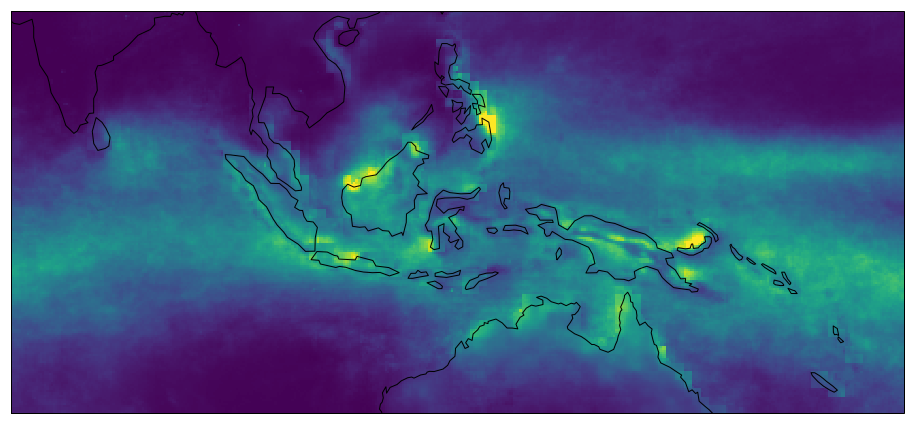

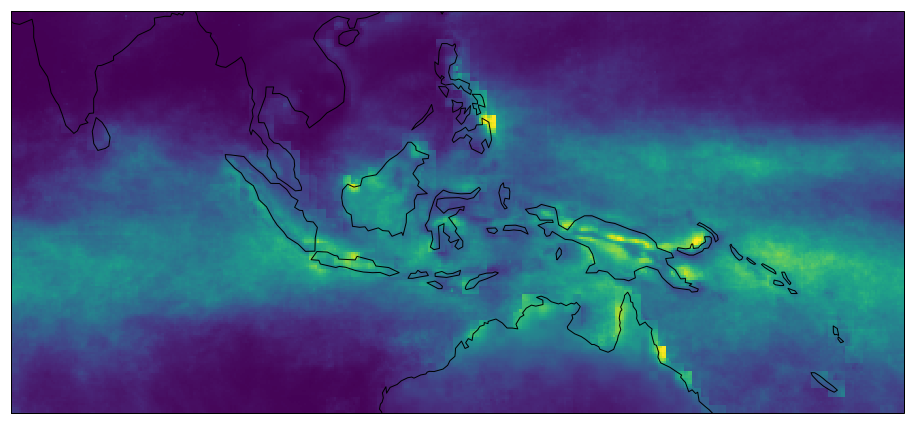

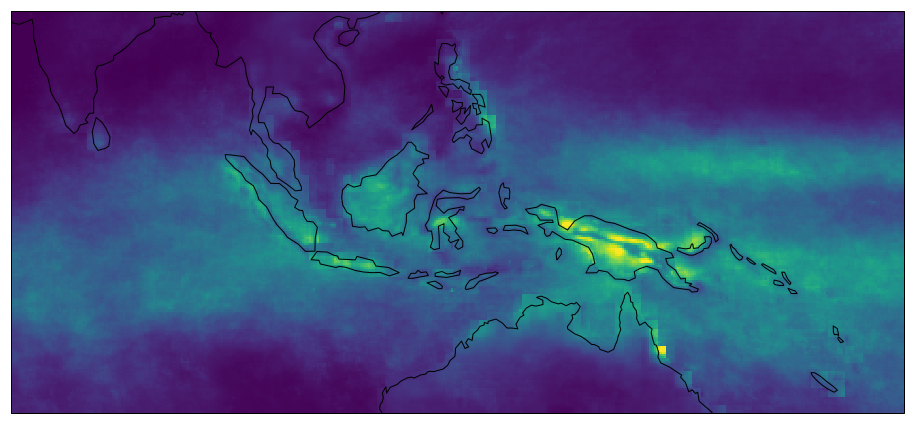

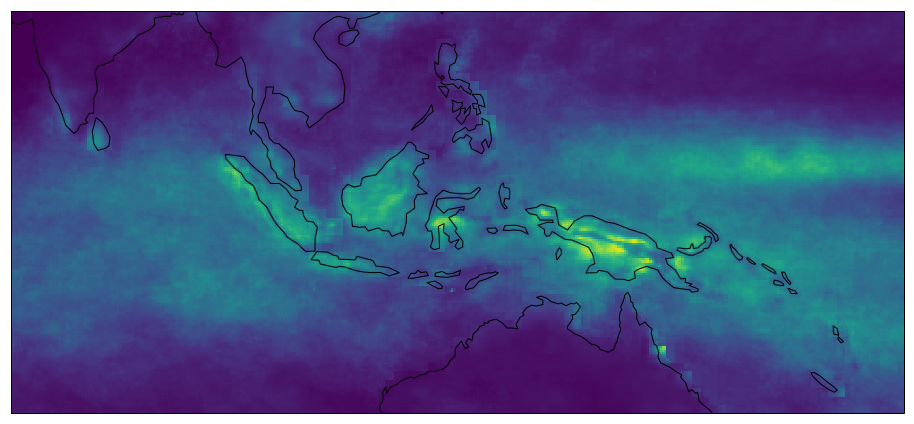

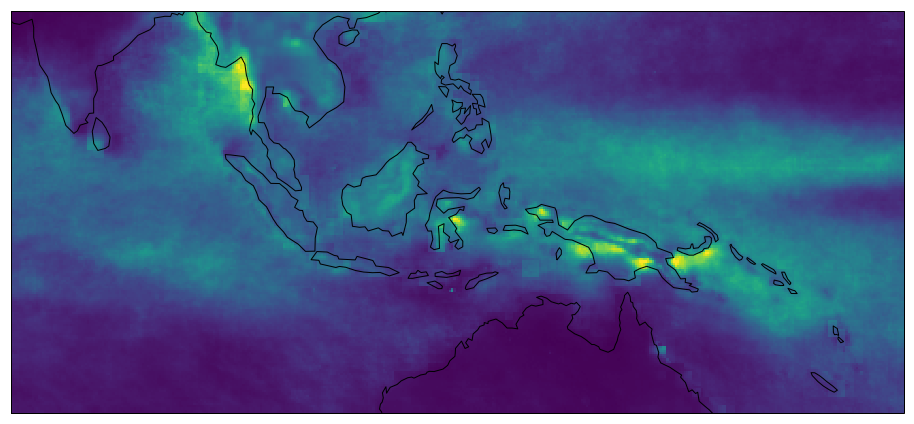

...

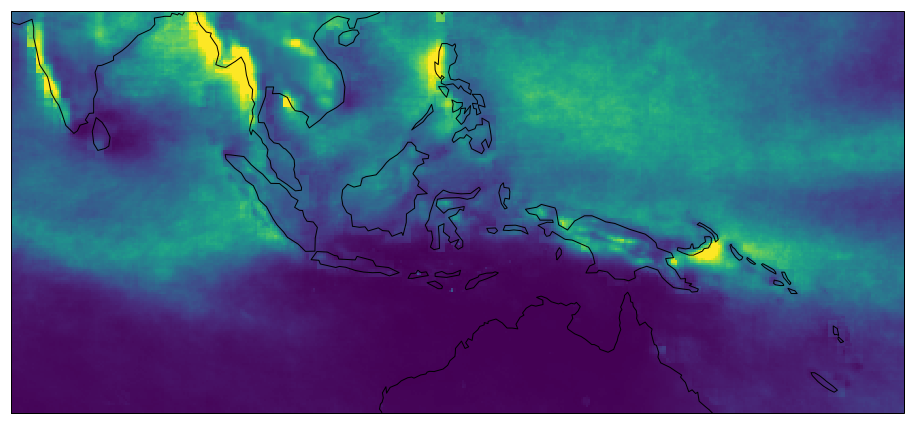

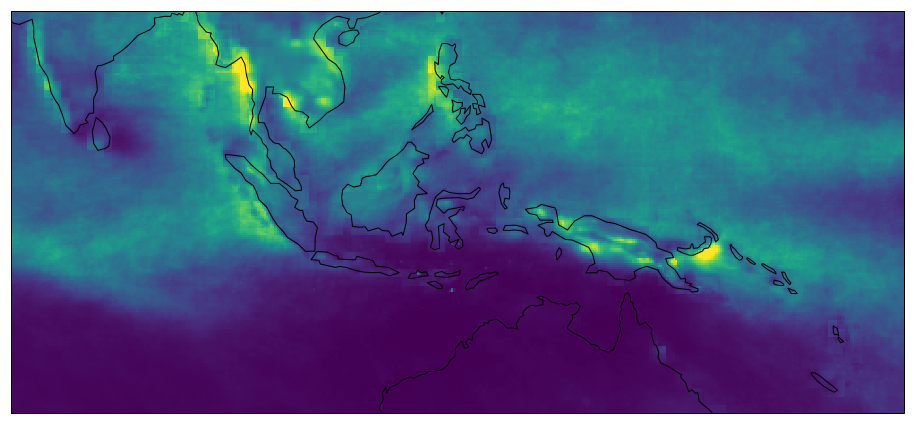

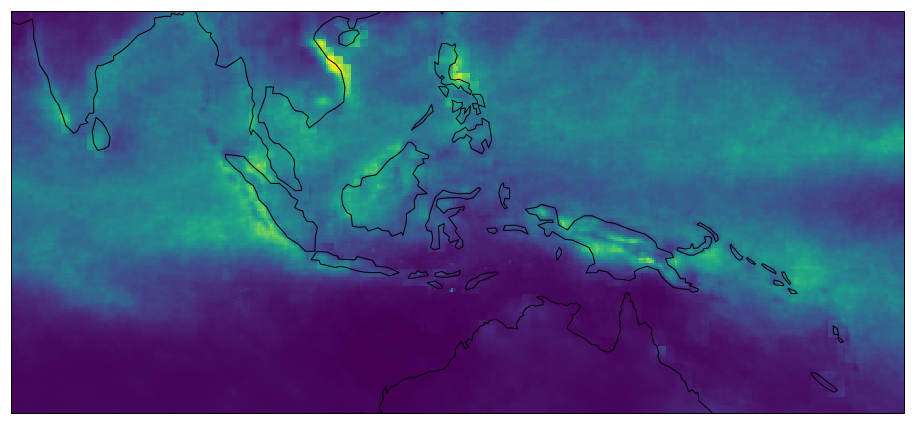

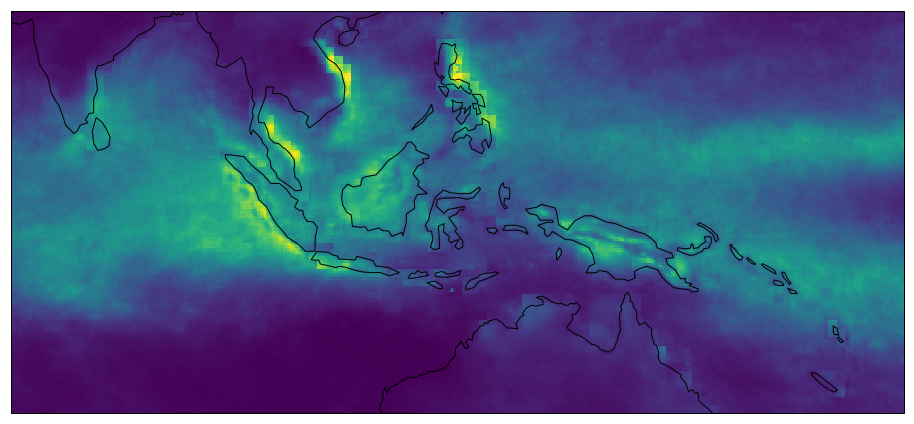

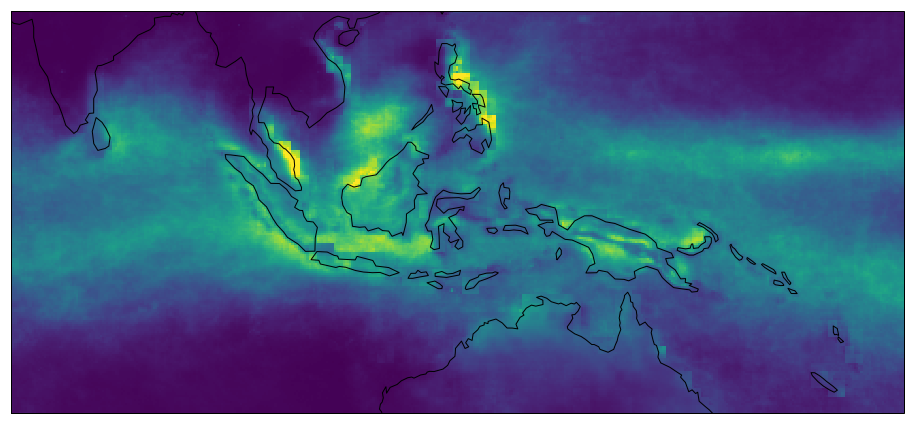

In [25]:
print(trmmmth.shape)
trmmyr=np.mean(trmmmth,axis=0)
for tt in range (0,12):
    plt.figure(tt)
    ax1=plt.subplot(projection=ccrs.PlateCarree())
    ax1.pcolor(trmm.lon[1000:-20], trmm.lat[100:-110],trmmyr[tt,100:-110,1000:-20],vmin=0,vmax=20)
    ax1.coastlines()
plt.show()

## Raw output exploration

In [18]:
out1=xr.open_dataset('../cesm_output_convert/analysis/wrfout_d01_0054-08-01_03:00:00')
print(out1.CLDFRA)

<xarray.DataArray 'CLDFRA' (Time: 1, bottom_top: 29, south_north: 99, west_east: 180)>
[516780 values with dtype=float32]
Coordinates:
    XLAT     (Time, south_north, west_east) float32 1.67043 1.67043 1.67043 ...
    XLONG    (Time, south_north, west_east) float32 80.6577 80.9078 81.1578 ...
    XTIME    (Time) object   54-07-31 03:00:00
Dimensions without coordinates: Time, bottom_top, south_north, west_east
Attributes:
    FieldType:    104
    MemoryOrder:  XYZ
    description:  CLOUD FRACTION
    units:        
    stagger:      


/home/likkhian/anaconda3/envs/python3env/lib/python3.6/site-packages/xarray/conventions.py:393: RuntimeWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy netCDF4.datetime objects instead, reason: dates out of range
  result = decode_cf_datetime(example_value, units, calendar)
/home/likkhian/anaconda3/envs/python3env/lib/python3.6/site-packages/xarray/conventions.py:412: RuntimeWarning: Unable to decode time axis into full numpy.datetime64 objects, continuing using dummy netCDF4.datetime objects instead, reason: dates out of range
  calendar=self.calendar)


In [19]:
raleigh=out1.CLDFRA[0,:,5:-5,5:-5]
print(raleigh.shape)
plt.figure(1)
maxx=np.max(np.mean(raleigh,axis=0))
minn=np.min(np.mean(raleigh,axis=0))
ax1=plt.subplot(projection=ccrs.PlateCarree())
ax1.contourf(s1.lon, s1.lat,np.mean(raleigh,axis=0))
ax1.coastlines()
sm = plt.cm.ScalarMappable(cmap='viridis',norm=plt.Normalize(minn,maxx))
sm._A = []
plt.colorbar(sm,ax=ax1,shrink=0.4)
plt.show()

(29, 89, 170)


TypeError: Length of x must be number of columns in z.

In [23]:
ss=np.zeros([2,2])
print(ss)
print(ss+1)

[[ 0.  0.]
 [ 0.  0.]]
[[ 1.  1.]
 [ 1.  1.]]
